In [1]:
import os
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import h5py

In [2]:
import scvi
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.1.6


In [3]:
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

In [4]:
adatas = [x for x in os.listdir('/mnt/c/Users/ethan/OneDrive/桌面/Heter_Neu/rawdata/') if x.endswith('.h5')]

In [5]:
adatas

['2022_15_BAL.h5',
 '2027_00_BAL.h5',
 '2042_00_BAL.h5',
 '2043_00_BAL.h5',
 '2050_00_BAL.h5',
 '2054_00_blood.h5',
 '2055_00_BAL.h5',
 '2060_41_blood.h5',
 '2070_00_blood.h5',
 '2072_00_blood.h5',
 '2074_00_blood.h5',
 '2075_00_blood.h5',
 '2094_01_blood.h5',
 'LT121L_00_BAL.h5',
 'LT121R_00_BAL.h5',
 'LT122RML_00_BAL.h5',
 'LT181L_00_BAL.h5',
 'LT205LUL_00_BAL.h5',
 'LT226LUL_00_BAL.h5',
 'LT236LLL_00_BAL.h5',
 'LT236LUL_00_BAL.h5',
 'LT243L_00_BAL.h5',
 'S14_00_blood.h5',
 'S15_00_blood.h5',
 'S16_00_blood.h5',
 'S17_00_blood.h5']

In [6]:
def load_it(adata):
    samp = adata.split('_')[0]
    days = adata.split('_')[1]
    ty = adata.split('_')[2].replace('.h5','')
    adata = sc.read_10x_h5('/mnt/c/Users/ethan/OneDrive/桌面/Heter_Neu/rawdata/' + adata)
    adata.var_names_make_unique()
    adata.obs['Patient'] = samp
    adata.obs['Days'] = days
    adata.obs['Type'] = ty
    adata.obs['Sample'] = adata.obs['Patient'] + '_' + adata.obs['Days'] + '_' + adata.obs['Type']
    adata.obs.index = adata.obs.index + '-' + samp + '_' + days + '_' + ty
    return adata

In [7]:
adatas = [load_it(ad) for ad in adatas]

In [8]:
adatas

[AnnData object with n_obs × n_vars = 33399 × 37143
     obs: 'Patient', 'Days', 'Type', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 102912 × 37143
     obs: 'Patient', 'Days', 'Type', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 221255 × 37143
     obs: 'Patient', 'Days', 'Type', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 53841 × 37143
     obs: 'Patient', 'Days', 'Type', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 116290 × 37143
     obs: 'Patient', 'Days', 'Type', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 98896 × 37143
     obs: 'Patient', 'Days', 'Type', 'Sample'
     var: 'gene_ids', 'feature_types', 'genome',
 AnnData object with n_obs × n_vars = 105136 × 37143
     obs: 'Patient', 'Days', 'Type', 'Sample'
     var: 'gene_

In [9]:
adata = sc.concat(adatas, join='outer')

In [10]:
adata.X.shape

(2818978, 37143)

In [11]:
adata.raw = adata

In [12]:
print (adata.raw)

Raw AnnData with n_obs × n_vars = 2818978 × 37143


In [13]:
sample_info = []
for sample in adata.obs['Sample'].unique():
    sample_data = adata[adata.obs['Sample'] == sample]
    sample_info.append([sample, sample_data.n_obs, sample_data.n_vars])

df = pd.DataFrame(sample_info, columns=['Sample_ID', 'Cell_Number', 'Gene_Number'])

df

,Sample_ID,Cell_Number,Gene_Number
0,2022_15_BAL,33399,37143
1,2027_00_BAL,102912,37143
2,2042_00_BAL,221255,37143
3,2043_00_BAL,53841,37143
4,2050_00_BAL,116290,37143
5,2054_00_blood,98896,37143
6,2055_00_BAL,105136,37143
7,2060_41_blood,64501,37143
8,2070_00_blood,90838,37143
9,2072_00_blood,116580,37143


In [14]:
adata

AnnData object with n_obs × n_vars = 2818978 × 37143
    obs: 'Patient', 'Days', 'Type', 'Sample'

In [15]:
#Remove genes (less than 50 cells expressed) from adata -- so here we remove genes not cells -- does not conflict with the filter below 
sc.pp.filter_genes(adata, min_counts=50)

In [16]:
#Minimal UMI counts = 30
sc.pp.filter_cells(adata, min_counts=30)

In [17]:
#here we remove cells with less than 15 genes expressed -- not conflict with the filter above
sc.pp.filter_cells(adata, min_genes=15) 

In [18]:
sample_info = []
for sample in adata.obs['Sample'].unique():
    sample_data = adata[adata.obs['Sample'] == sample]
    sample_info.append([sample, sample_data.n_obs, sample_data.n_vars])

df = pd.DataFrame(sample_info, columns=['Sample_ID', 'Cell_Number', 'Gene_Number'])

df

,Sample_ID,Cell_Number,Gene_Number
0,2022_15_BAL,61,12742
1,2027_00_BAL,2101,12742
2,2042_00_BAL,32384,12742
3,2043_00_BAL,616,12742
4,2050_00_BAL,3049,12742
5,2054_00_blood,4089,12742
6,2055_00_BAL,2235,12742
7,2060_41_blood,639,12742
8,2070_00_blood,3097,12742
9,2072_00_blood,5475,12742


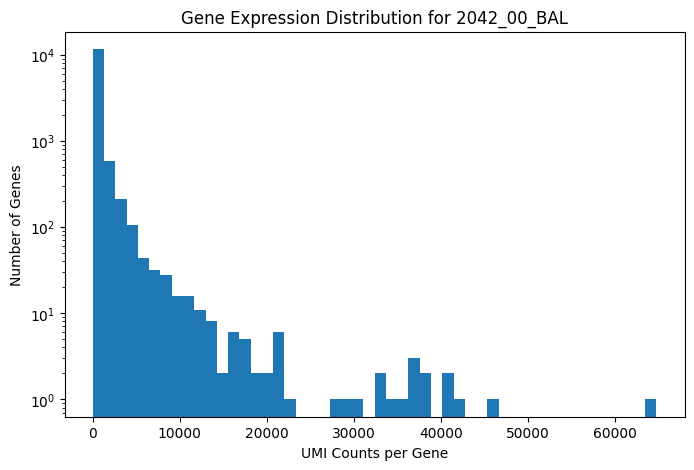

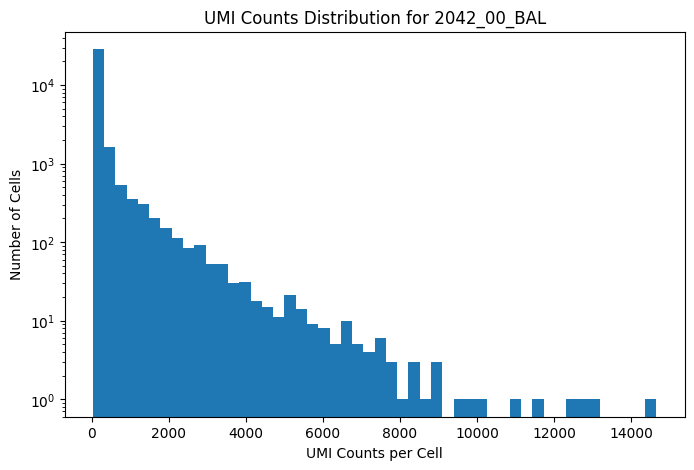

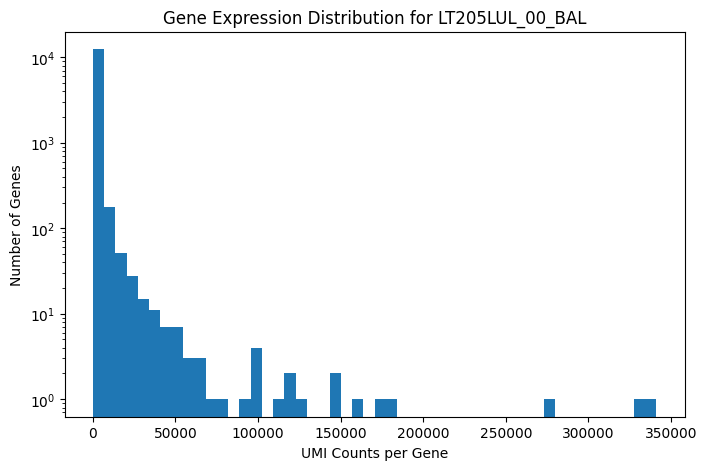

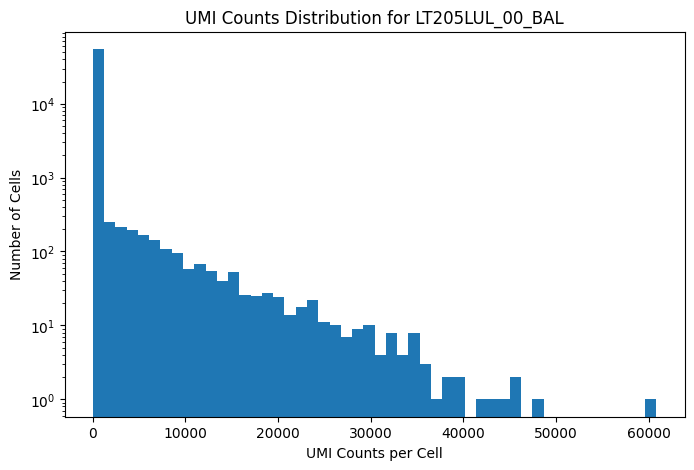

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# filter out high cell number samples >14000
high_cell_samples = df[df['Cell_Number'] > 14000]['Sample_ID']

# collect data and visualize
for sample_id in high_cell_samples:
    # pull data out
    sample_data = adata[adata.obs['Sample'] == sample_id]

    # gene counts distribution
    gene_counts = np.array(sample_data.X.sum(axis=0)).flatten()
    
    plt.figure(figsize=(8, 5))
    plt.hist(gene_counts, bins=50, log=True)
    plt.title(f'Gene Expression Distribution for {sample_id}')
    plt.xlabel('UMI Counts per Gene')
    plt.ylabel('Number of Genes')
    plt.show()
    
    # UMI counts distribution
    cell_counts = np.array(sample_data.X.sum(axis=1)).flatten()
    
    plt.figure(figsize=(8, 5))
    plt.hist(cell_counts, bins=50, log=True)
    plt.title(f'UMI Counts Distribution for {sample_id}')
    plt.xlabel('UMI Counts per Cell')
    plt.ylabel('Number of Cells')
    plt.show()


In [20]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

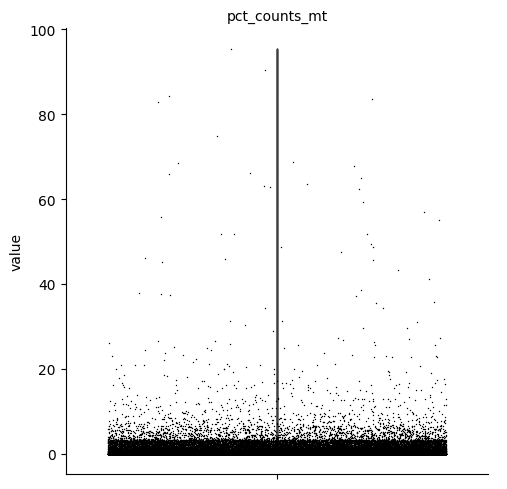

In [21]:
sc.pl.violin(adata, 'pct_counts_mt', jitter=0.4, multi_panel=True)

In [22]:
adata = adata[adata.obs['pct_counts_mt'] < 20, :].copy()

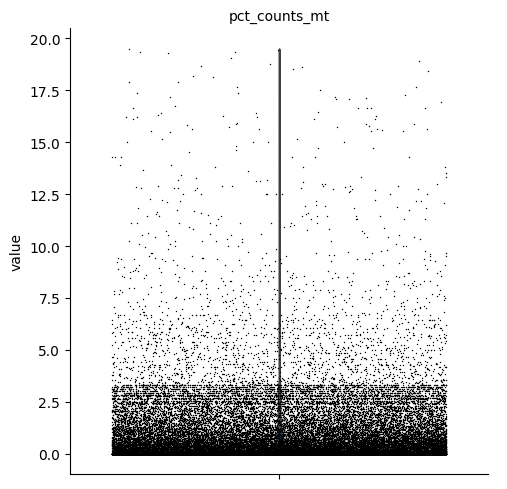

In [23]:
sc.pl.violin(adata, 'pct_counts_mt', jitter=0.4, multi_panel=True)

In [24]:
sample_info = []
for sample in adata.obs['Sample'].unique():
    sample_data = adata[adata.obs['Sample'] == sample]
    sample_info.append([sample, sample_data.n_obs, sample_data.n_vars])

df = pd.DataFrame(sample_info, columns=['Sample_ID', 'Cell_Number', 'Gene_Number'])

df

,Sample_ID,Cell_Number,Gene_Number
0,2022_15_BAL,61,12742
1,2027_00_BAL,2099,12742
2,2042_00_BAL,32379,12742
3,2043_00_BAL,616,12742
4,2050_00_BAL,3049,12742
5,2054_00_blood,4087,12742
6,2055_00_BAL,2231,12742
7,2060_41_blood,639,12742
8,2070_00_blood,3094,12742
9,2072_00_blood,5473,12742


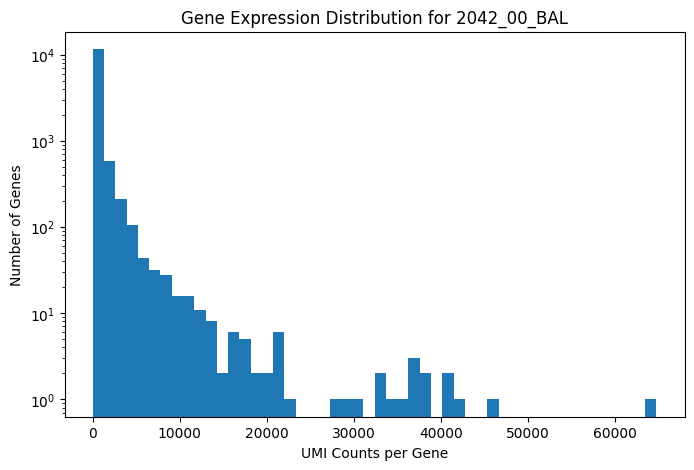

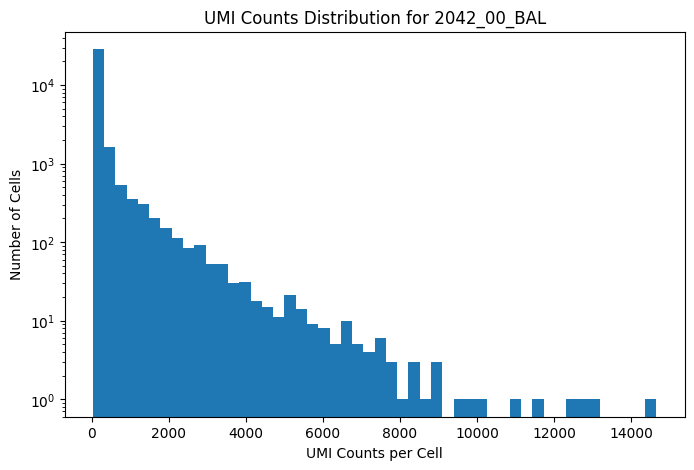

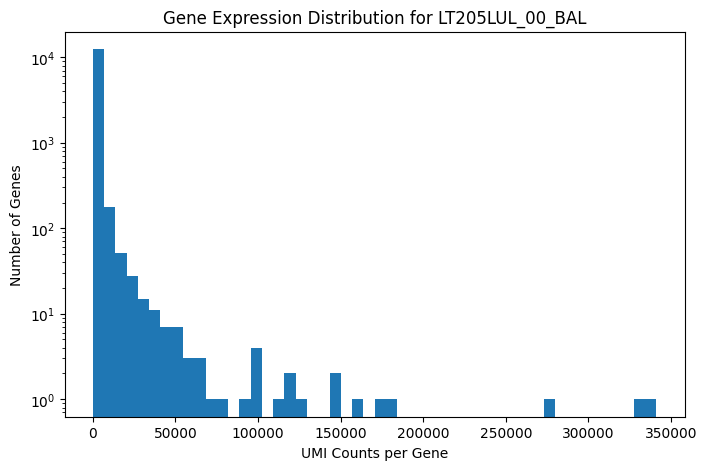

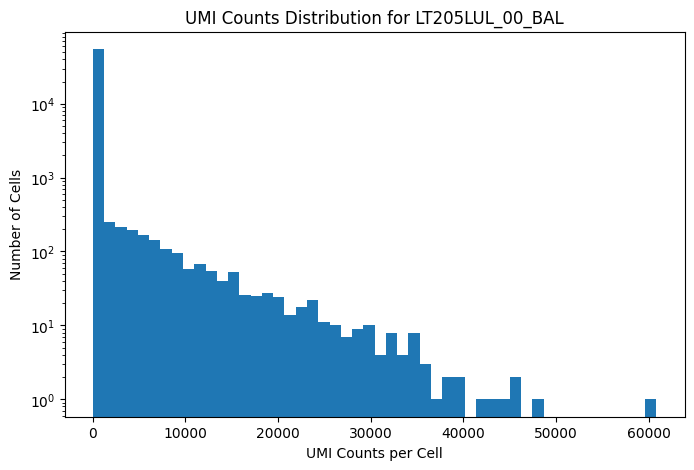

In [25]:
import matplotlib.pyplot as plt
import numpy as np

# filter out high cell number samples >14000
high_cell_samples = df[df['Cell_Number'] > 14000]['Sample_ID']

# collect data and visualize
for sample_id in high_cell_samples:
    # pull data out
    sample_data = adata[adata.obs['Sample'] == sample_id]

    # gene counts distribution
    gene_counts = np.array(sample_data.X.sum(axis=0)).flatten()
    
    plt.figure(figsize=(8, 5))
    plt.hist(gene_counts, bins=50, log=True)
    plt.title(f'Gene Expression Distribution for {sample_id}')
    plt.xlabel('UMI Counts per Gene')
    plt.ylabel('Number of Genes')
    plt.show()
    
    # UMI counts distribution
    cell_counts = np.array(sample_data.X.sum(axis=1)).flatten()
    
    plt.figure(figsize=(8, 5))
    plt.hist(cell_counts, bins=50, log=True)
    plt.title(f'UMI Counts Distribution for {sample_id}')
    plt.xlabel('UMI Counts per Cell')
    plt.ylabel('Number of Cells')
    plt.show()


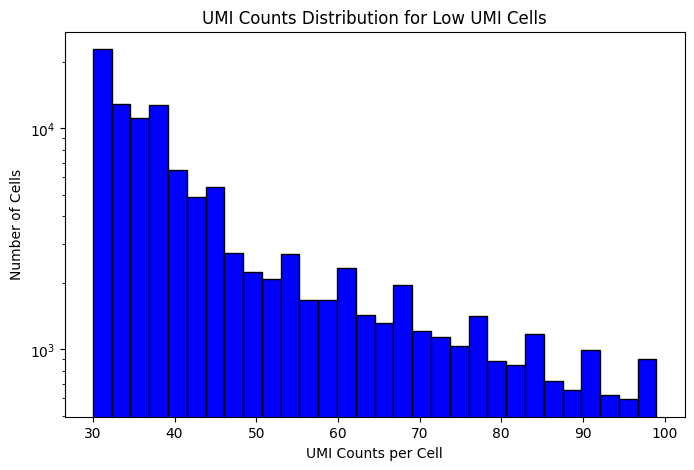

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# threshold of low umi
low_umi_threshold = 100

# pulll out low umi cells < 100
low_umi_cells = adata[adata.obs['n_counts'] < low_umi_threshold]

# pull out cell number
low_umi_counts = np.array(low_umi_cells.obs['n_counts'])

# plot
plt.figure(figsize=(8, 5))
plt.hist(low_umi_counts, bins=30, color='blue', edgecolor='black')
plt.title('UMI Counts Distribution for Low UMI Cells')
plt.xlabel('UMI Counts per Cell')
plt.ylabel('Number of Cells')
plt.yscale('log') 
plt.show()


In [27]:
#Minimal UMI counts = 50
sc.pp.filter_cells(adata, min_counts=50)

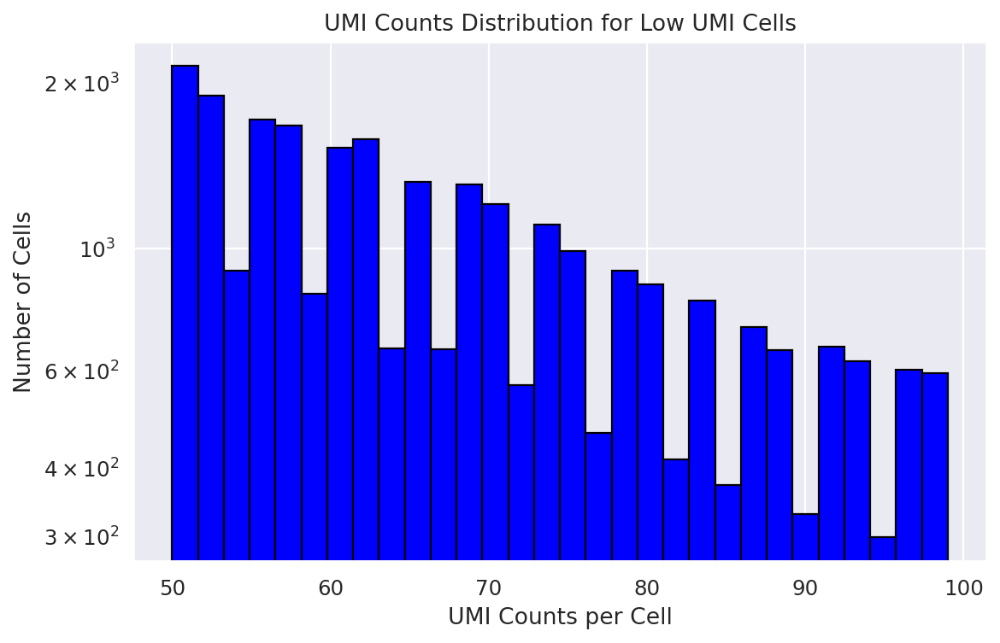

In [73]:
low_umi_threshold = 100

# pulll out low umi cells < 100
low_umi_cells = adata[adata.obs['n_counts'] < low_umi_threshold]

# pull out cell number
low_umi_counts = np.array(low_umi_cells.obs['n_counts'])

# plot
plt.figure(figsize=(8, 5))
plt.hist(low_umi_counts, bins=30, color='blue', edgecolor='black')
plt.title('UMI Counts Distribution for Low UMI Cells')
plt.xlabel('UMI Counts per Cell')
plt.ylabel('Number of Cells')
plt.yscale('log') 
plt.show()

In [74]:
sample_info = []
for sample in adata.obs['Sample'].unique():
    sample_data = adata[adata.obs['Sample'] == sample]
    sample_info.append([sample, sample_data.n_obs, sample_data.n_vars])

df = pd.DataFrame(sample_info, columns=['Sample_ID', 'Cell_Number', 'Gene_Number'])

df

,Sample_ID,Cell_Number,Gene_Number
0,2022_15_BAL,22,12742
1,2027_00_BAL,1786,12742
2,2042_00_BAL,15094,12742
3,2043_00_BAL,147,12742
4,2050_00_BAL,2933,12742
5,2054_00_blood,3588,12742
6,2055_00_BAL,2097,12742
7,2060_41_blood,280,12742
8,2070_00_blood,2356,12742
9,2072_00_blood,5015,12742


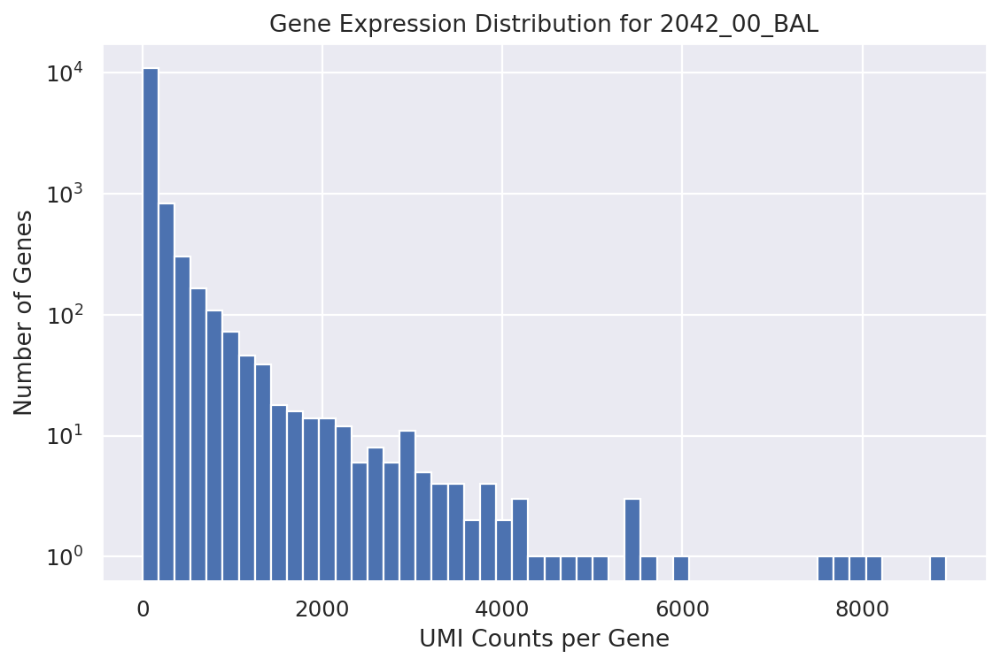

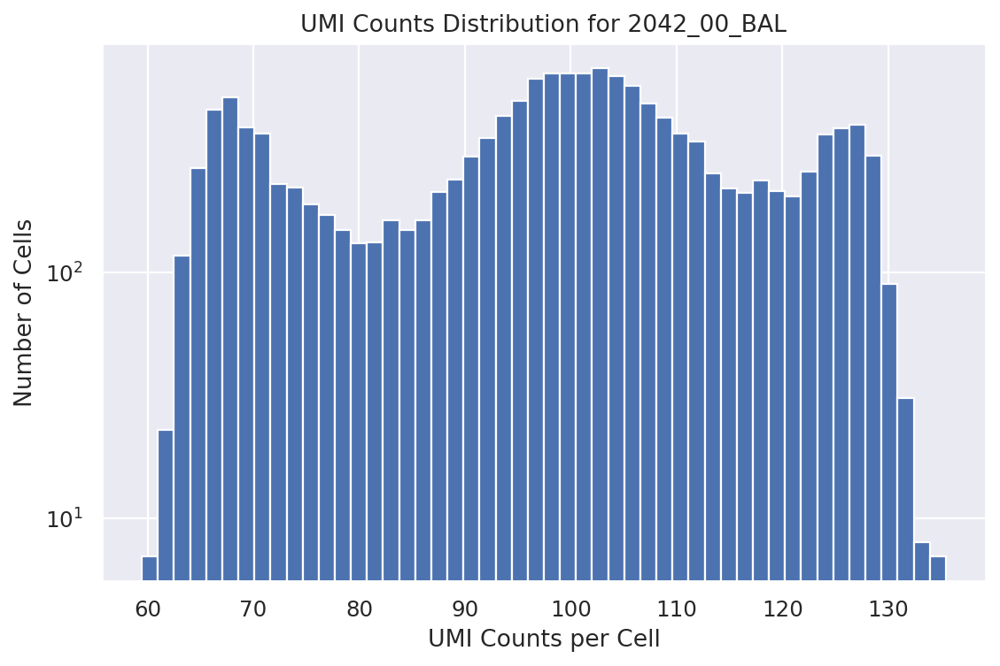

In [75]:
# filter out high cell number samples >14000
high_cell_samples = df[df['Cell_Number'] > 14000]['Sample_ID']

# collect data and visualize
for sample_id in high_cell_samples:
    # pull data out
    sample_data = adata[adata.obs['Sample'] == sample_id]

    # gene counts distribution
    gene_counts = np.array(sample_data.X.sum(axis=0)).flatten()
    
    plt.figure(figsize=(8, 5))
    plt.hist(gene_counts, bins=50, log=True)
    plt.title(f'Gene Expression Distribution for {sample_id}')
    plt.xlabel('UMI Counts per Gene')
    plt.ylabel('Number of Genes')
    plt.show()
    
    # UMI counts distribution
    cell_counts = np.array(sample_data.X.sum(axis=1)).flatten()
    
    plt.figure(figsize=(8, 5))
    plt.hist(cell_counts, bins=50, log=True)
    plt.title(f'UMI Counts Distribution for {sample_id}')
    plt.xlabel('UMI Counts per Cell')
    plt.ylabel('Number of Cells')
    plt.show()


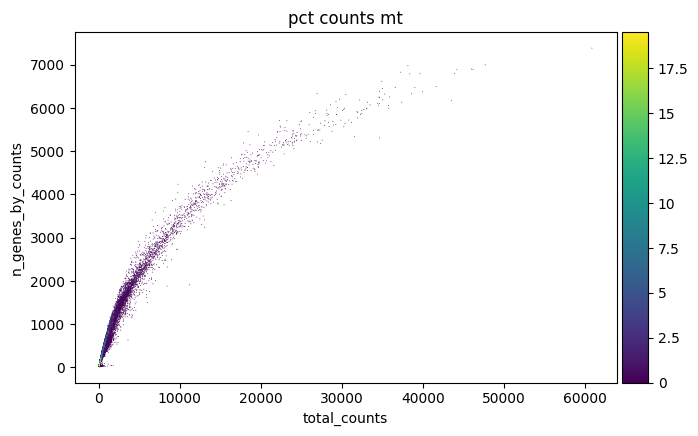

In [29]:
#UMI counts vs genes detected per cell
sc.pl.scatter(
    adata, 
    x='total_counts', 
    y='n_genes_by_counts', 
    color='pct_counts_mt', 
)

In [30]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [31]:
scvi.model.SCVI.setup_anndata(adata)

In [32]:
model = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

In [33]:
model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 106/106: 100%|██████████████| 106/106 [10:29<00:00,  5.77s/it, v_num=1, train_loss_step=399, train_loss_epoch=371]

`Trainer.fit` stopped: `max_epochs=106` reached.


Epoch 106/106: 100%|██████████████| 106/106 [10:29<00:00,  5.94s/it, v_num=1, train_loss_step=399, train_loss_epoch=371]


In [34]:
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = model.get_latent_representation()

In [35]:
sc.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(adata)

In [36]:
SCVI_MDE_KEY = "X_scVI_MDE"
adata.obsm[SCVI_MDE_KEY] = scvi.model.utils.mde(adata.obsm[SCVI_LATENT_KEY])

INFO     Using cuda:0 for `pymde.preserve_neighbors`.                                                              


In [37]:
model.save("/mnt/c/Users/ethan/OneDrive/桌面/Heter_Neu/SC1186/model-integrated")

In [38]:
#load model

In [39]:
import torch
import tempfile
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

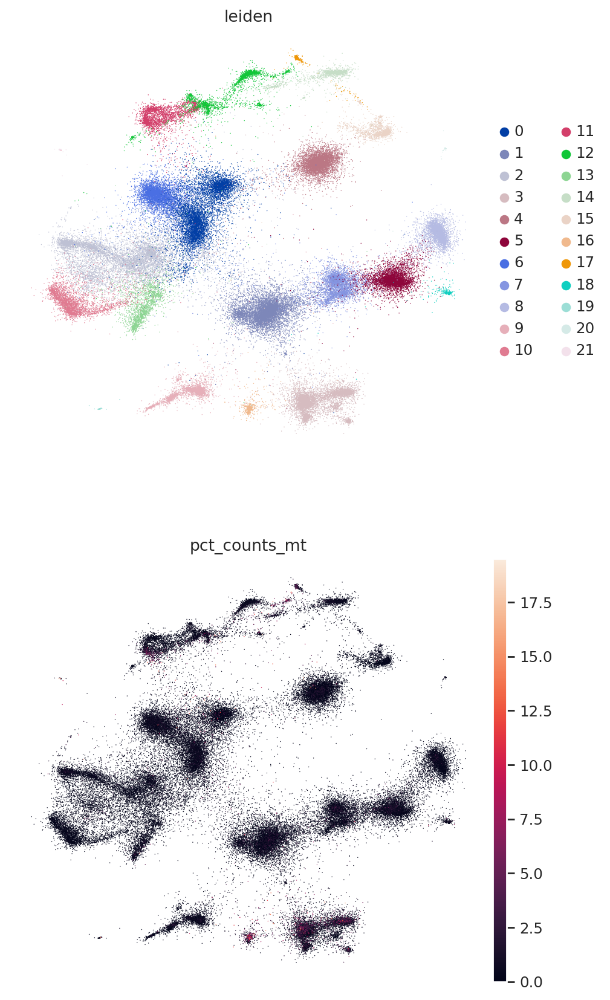

In [40]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=["leiden","pct_counts_mt"],
    frameon=False,
    ncols=1,
)

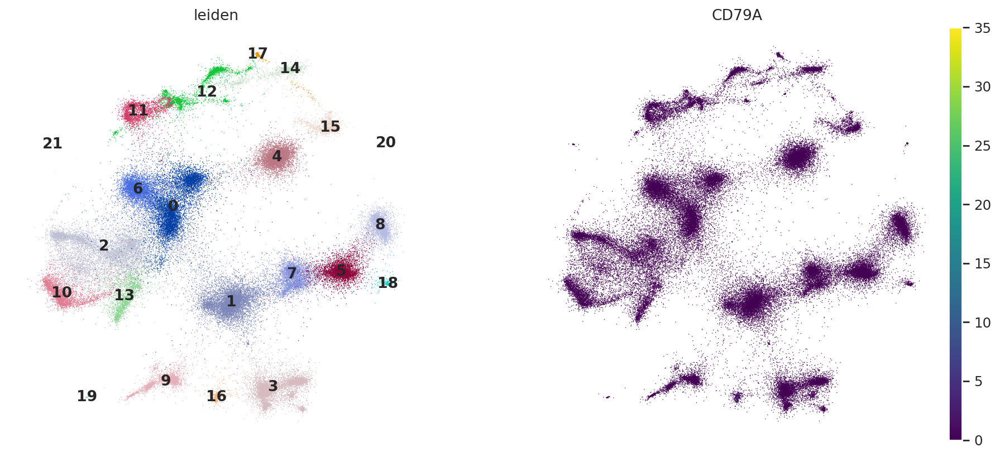

In [41]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'CD79A'],
    frameon=False,
    ncols=3,
    cmap='viridis',
    legend_loc='on data',
    legend_fontsize=12
)

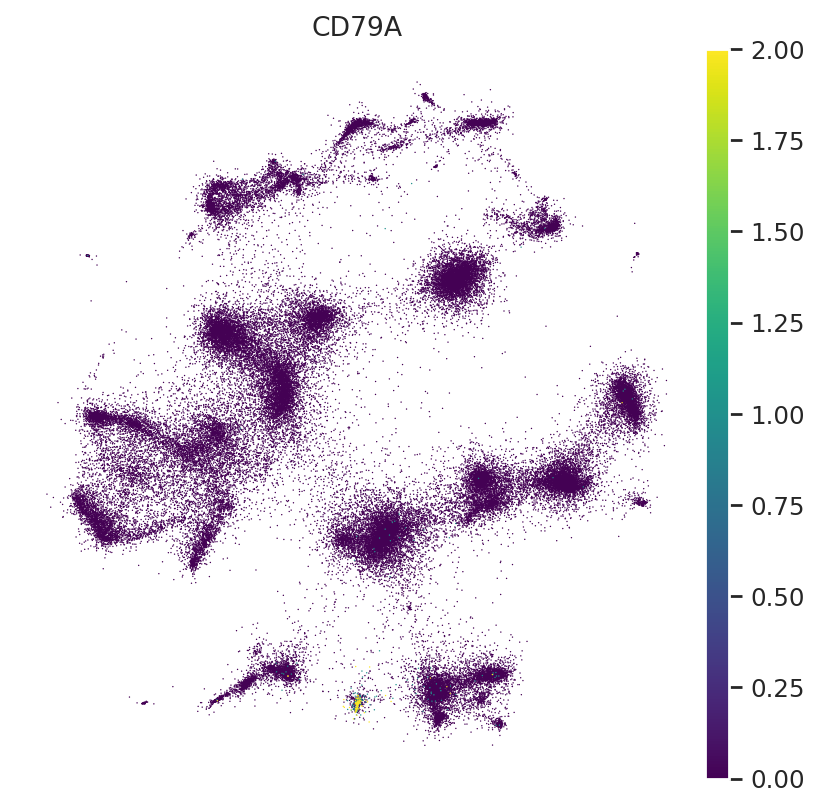

In [64]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['CD79A'],
    frameon=False,
    ncols=3,
    cmap='viridis',
    legend_loc='on data',
    legend_fontsize=12,
    vmax=2
)

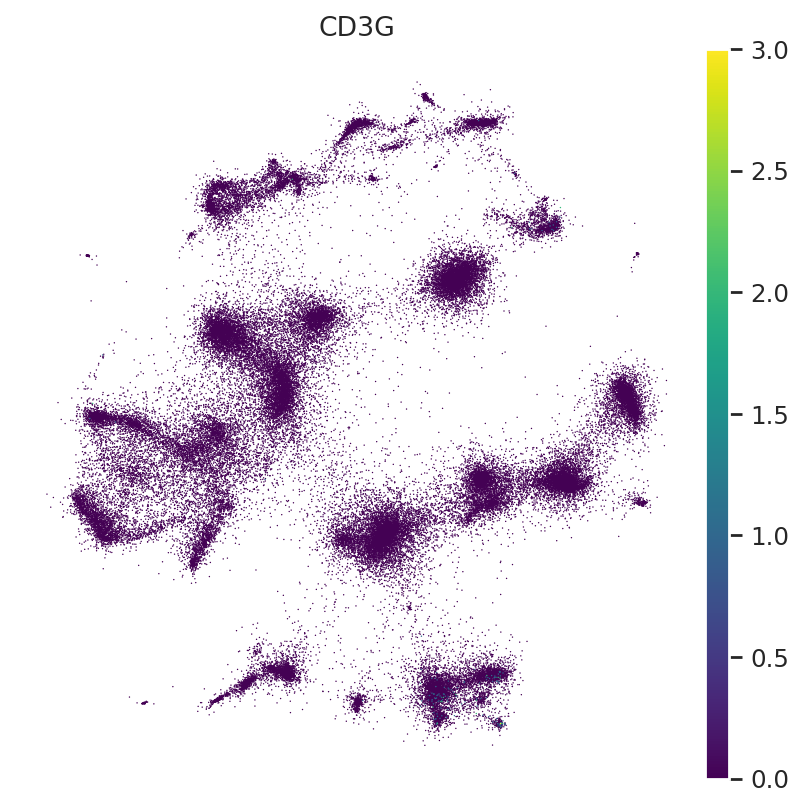

In [43]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['CD3G'],
    frameon=False,
    ncols=3,
    cmap='viridis',
    legend_fontsize=12
)

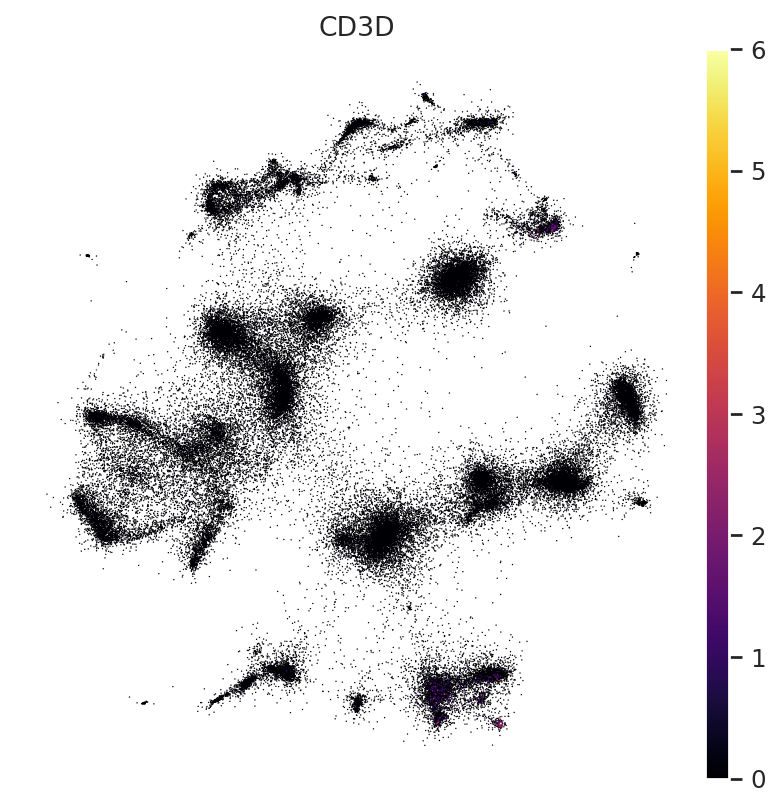

In [44]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['CD3D'],
    frameon=False,
    ncols=3,
    cmap='inferno',
    legend_loc='on data',
    legend_fontsize=12
)

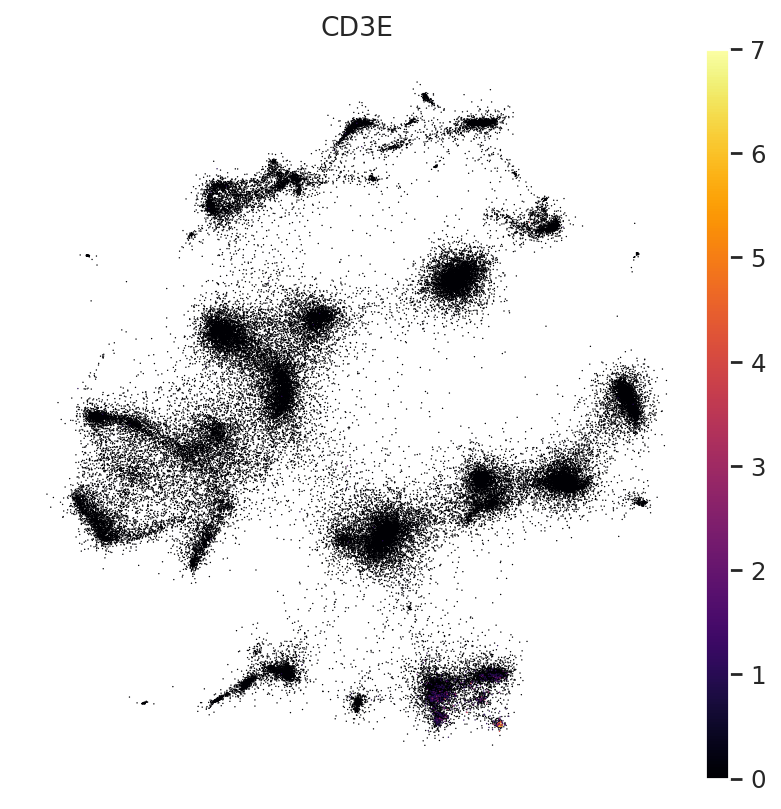

In [45]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['CD3E'],
    frameon=False,
    ncols=3,
    cmap='inferno',
    legend_loc='on data',
    legend_fontsize=12
)

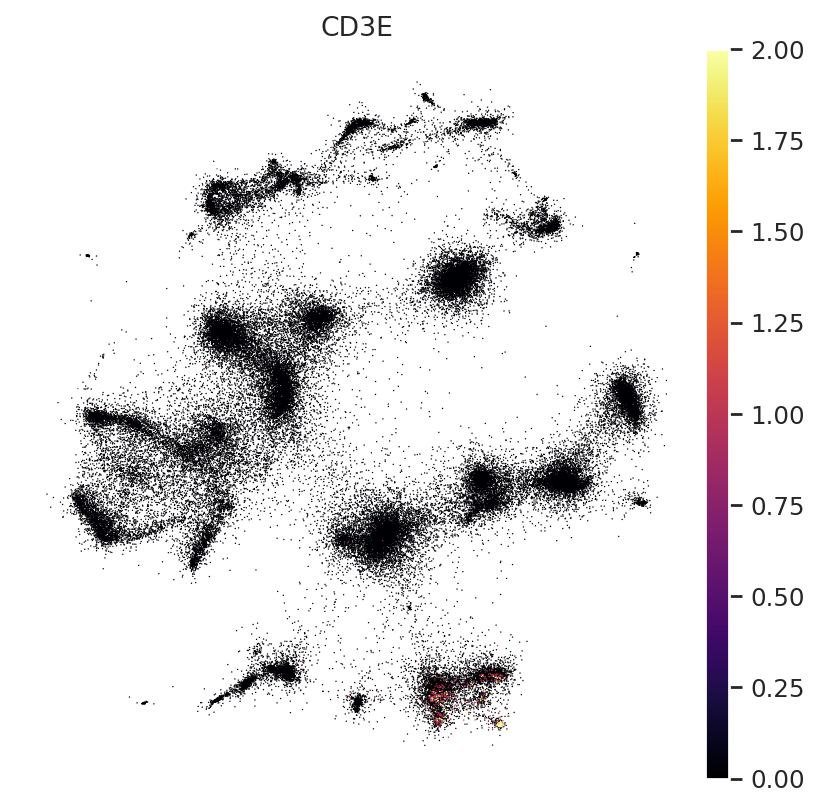

In [46]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['CD3E'],
    frameon=False,
    ncols=3,
    cmap='inferno',
    legend_loc='on data',
    legend_fontsize=12,
    vmax=2
)

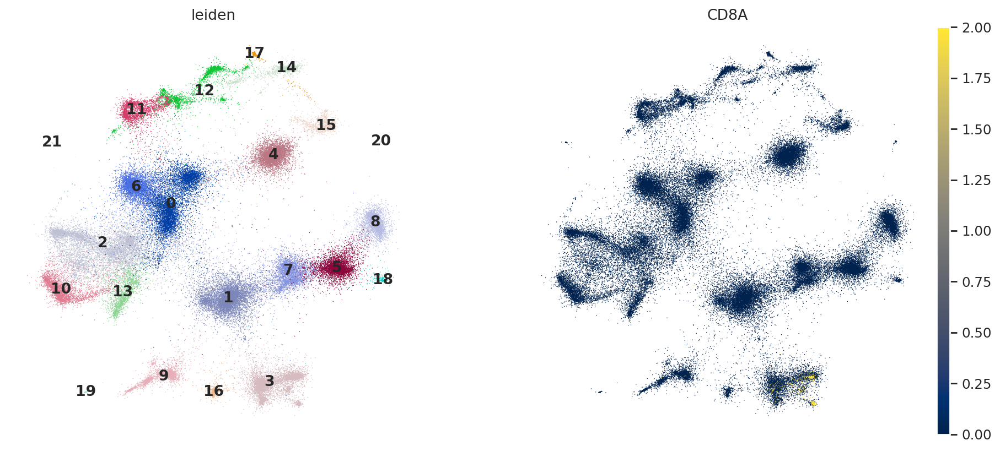

In [47]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'CD8A'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12,
    vmin=0,
    vmax=2
)

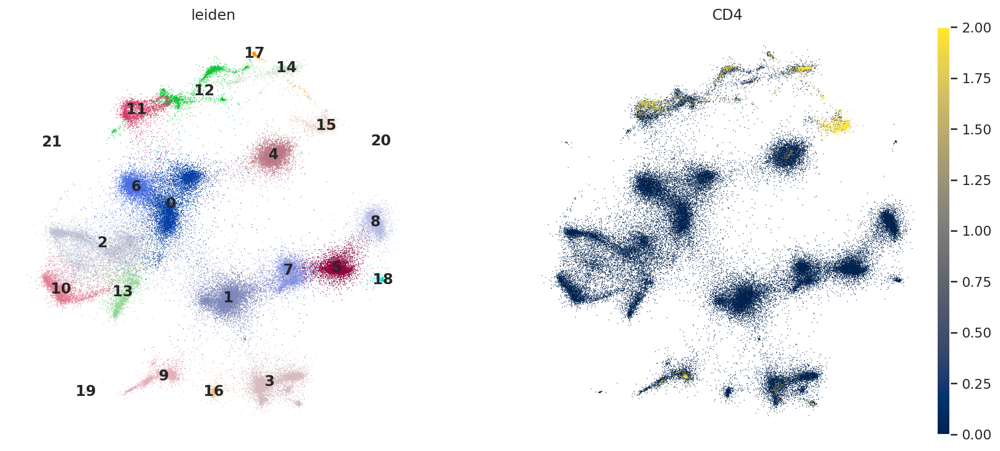

In [48]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'CD4'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12,
    vmin=0,
    vmax=2
)

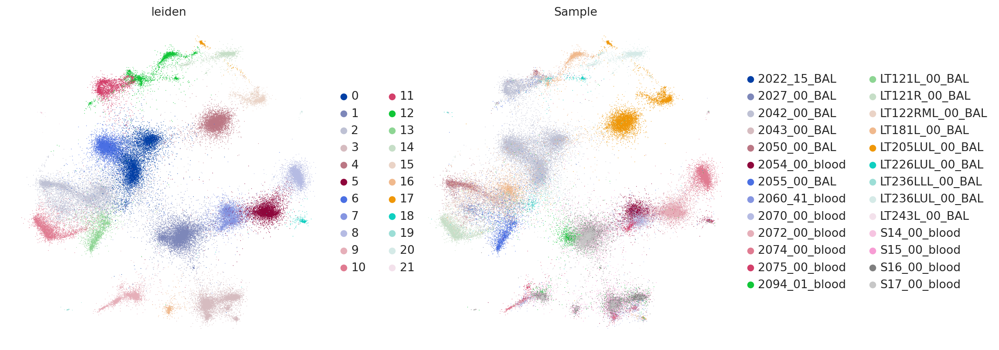

In [49]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'Sample'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_fontsize=12,
    vmin=0,
    vmax=2
)

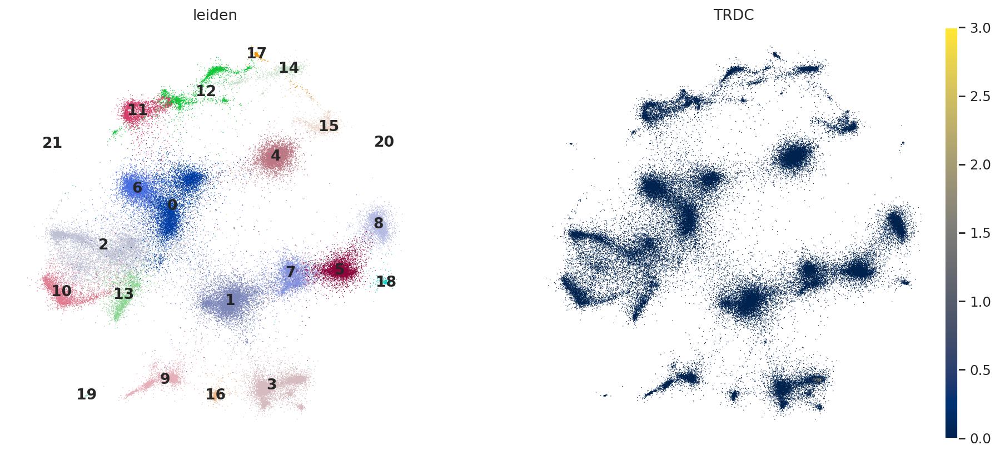

In [65]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'TRDC'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12
)

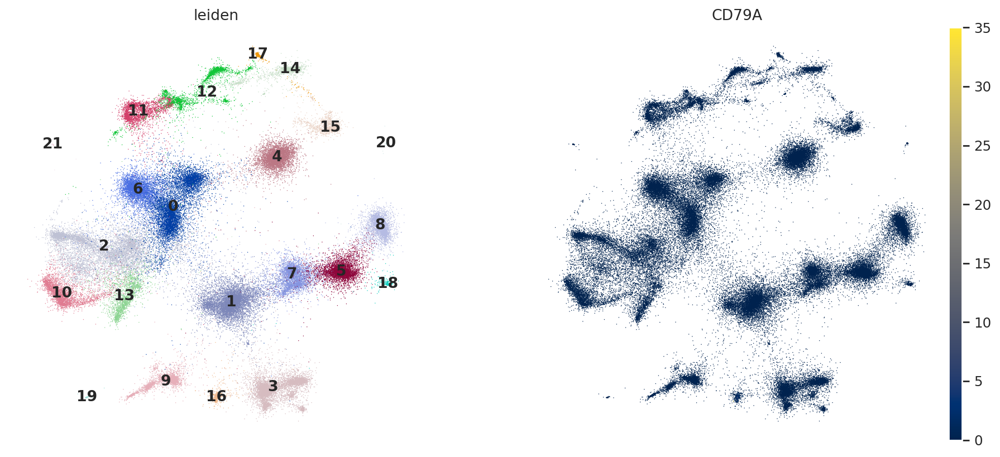

In [66]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'CD79A'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12
)

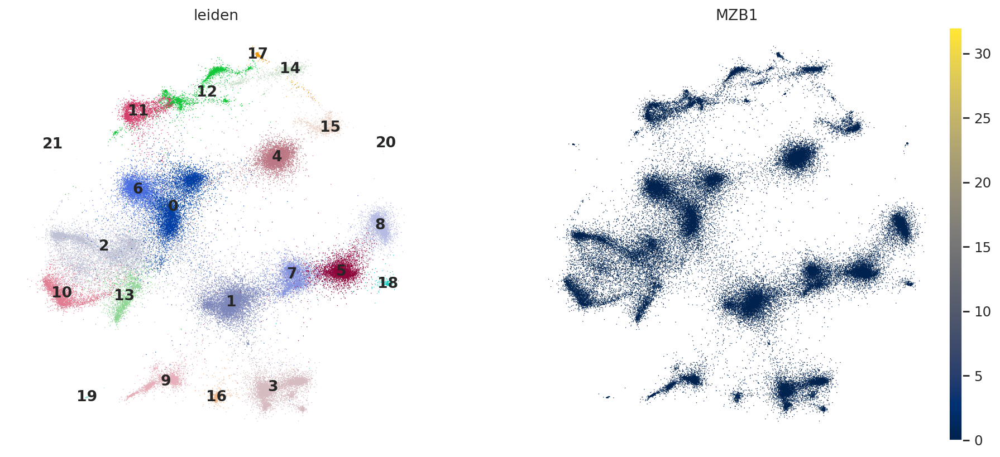

In [67]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'MZB1'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12
)

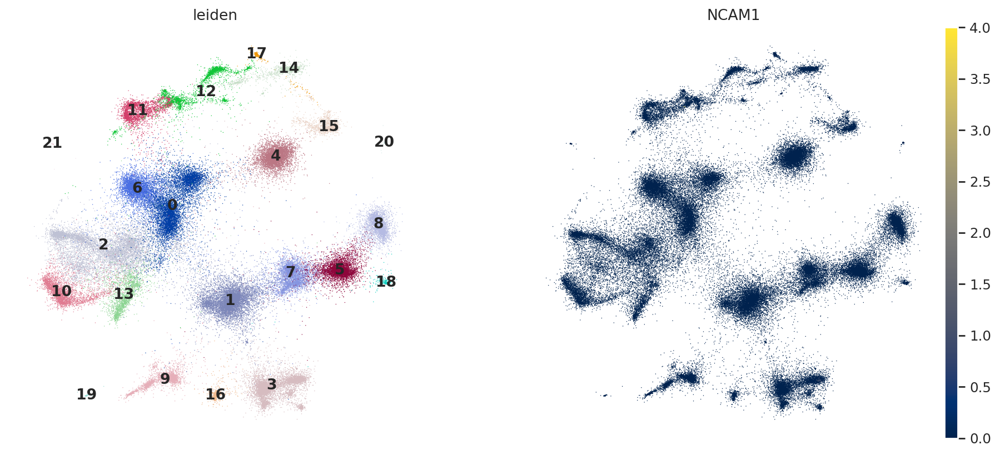

In [68]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'NCAM1'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12
)

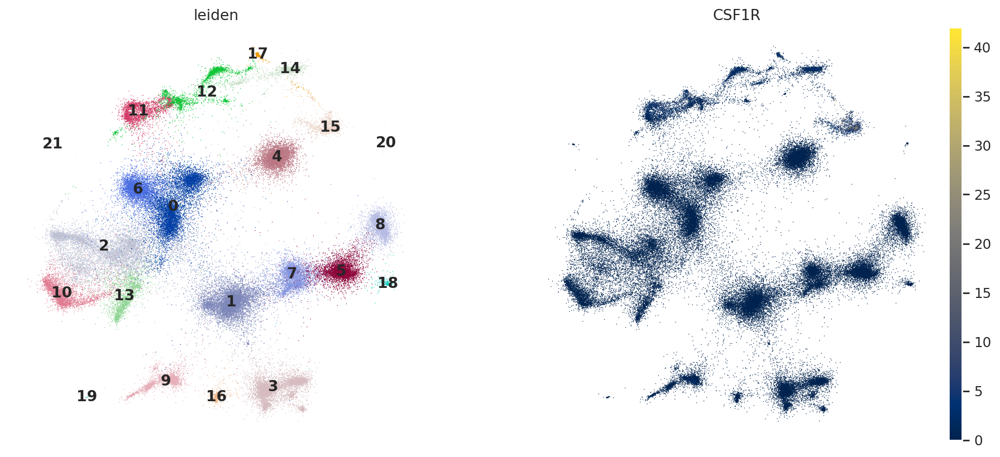

In [69]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'CSF1R'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12
)

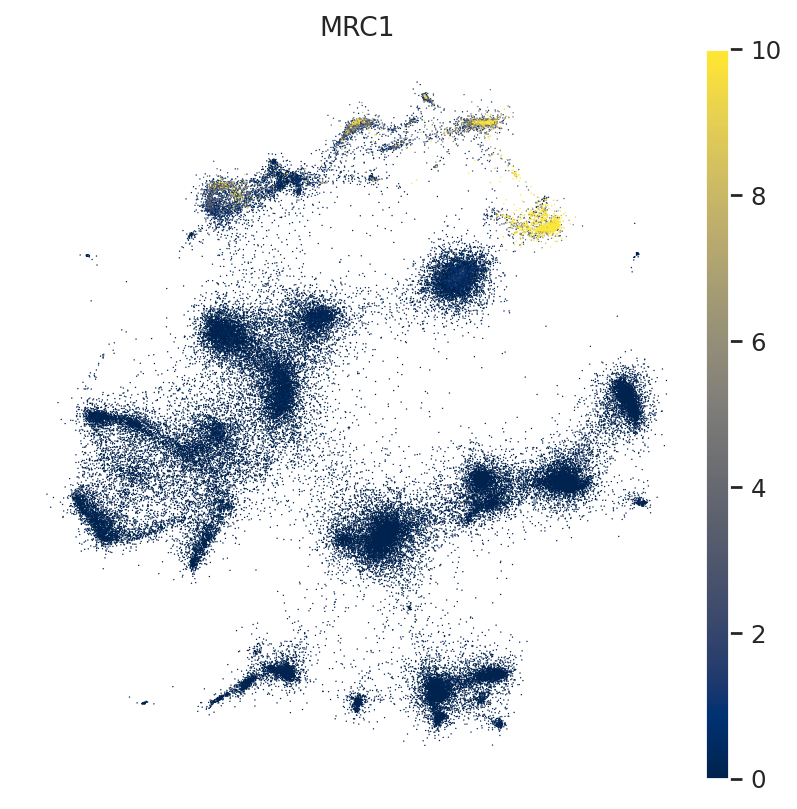

In [72]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['MRC1'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12,
    vmax=10
)

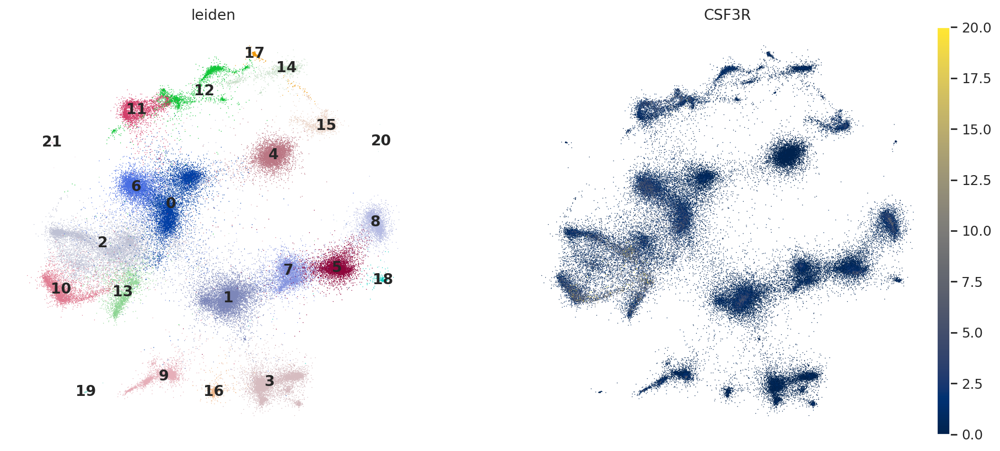

In [78]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'CSF3R'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12,
    vmax=20
)

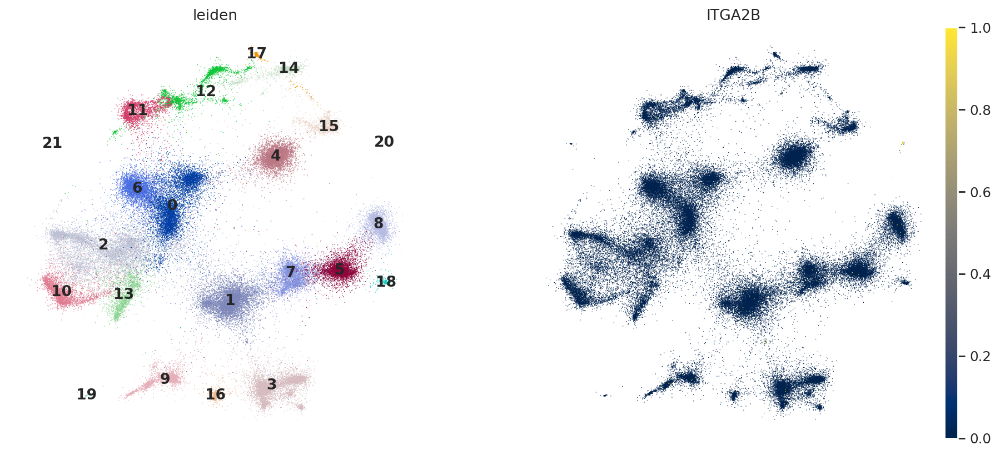

In [57]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'ITGA2B'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12,
    vmin=0,
    vmax=1
)

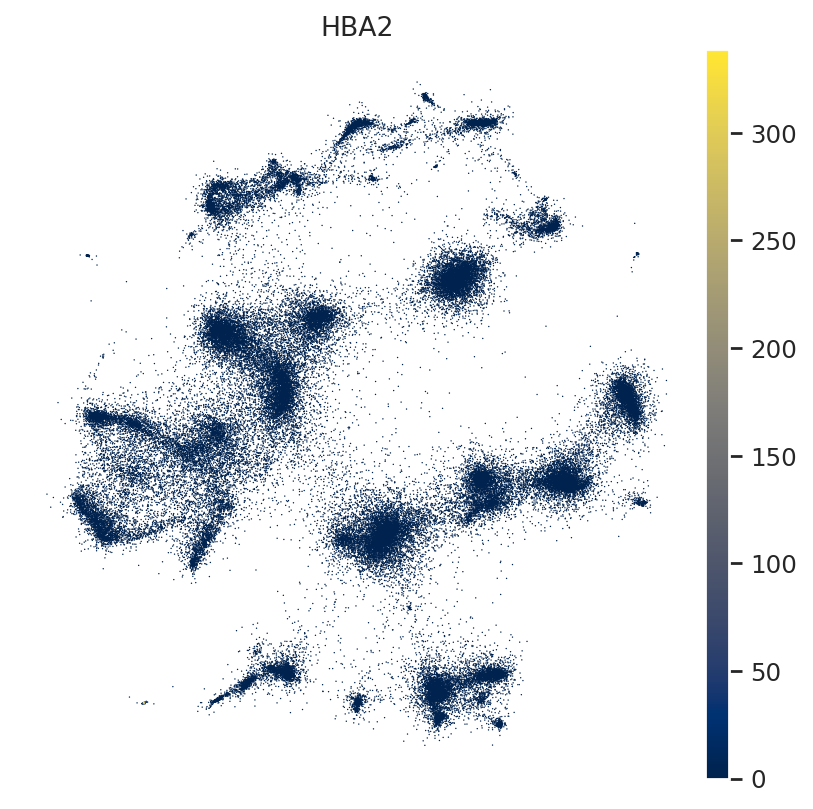

In [79]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['HBA2'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12
)

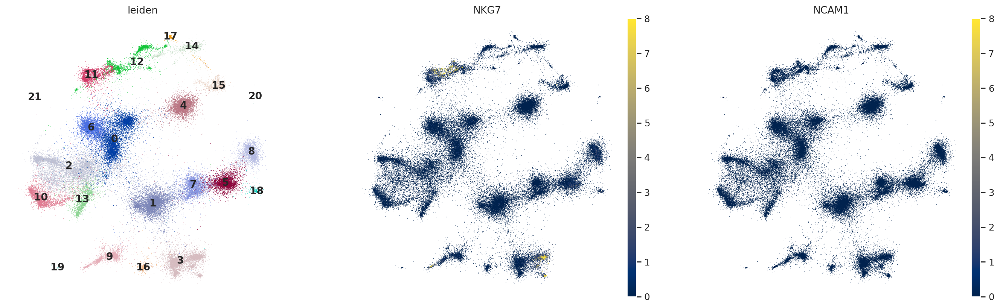

In [59]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['leiden', 'NKG7','NCAM1'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_loc='on data',
    legend_fontsize=12,
    vmin=0,
    vmax=8
)

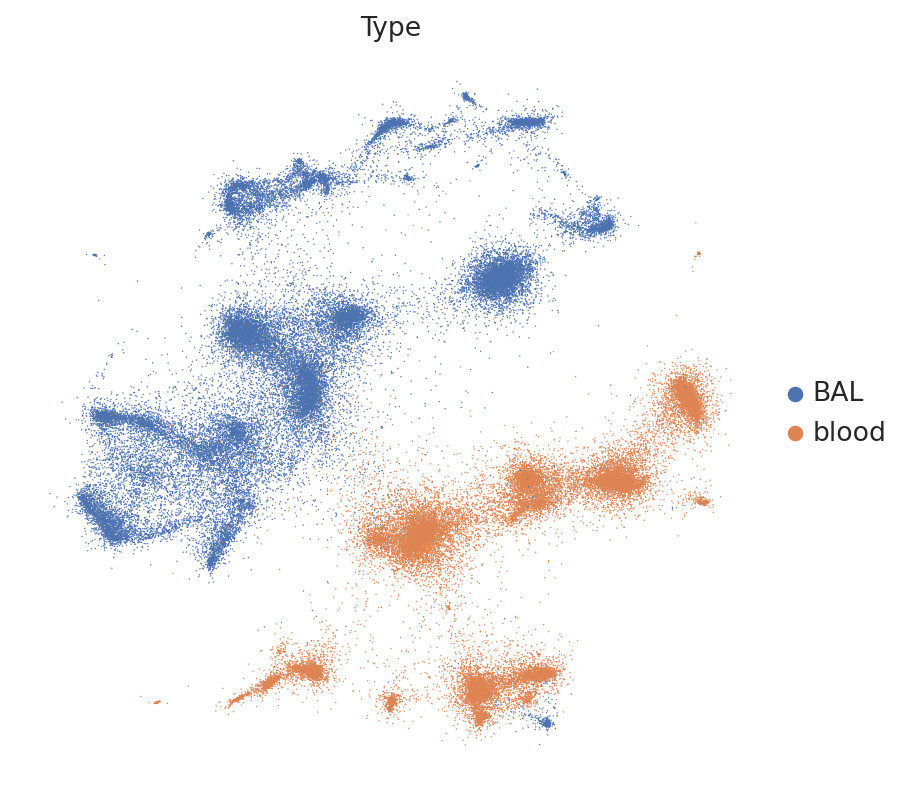

In [60]:
sc.pl.embedding(
    adata,
    basis=SCVI_MDE_KEY,
    color=['Type'],
    frameon=False,
    ncols=3,
    cmap='cividis',
    legend_fontsize=12
)

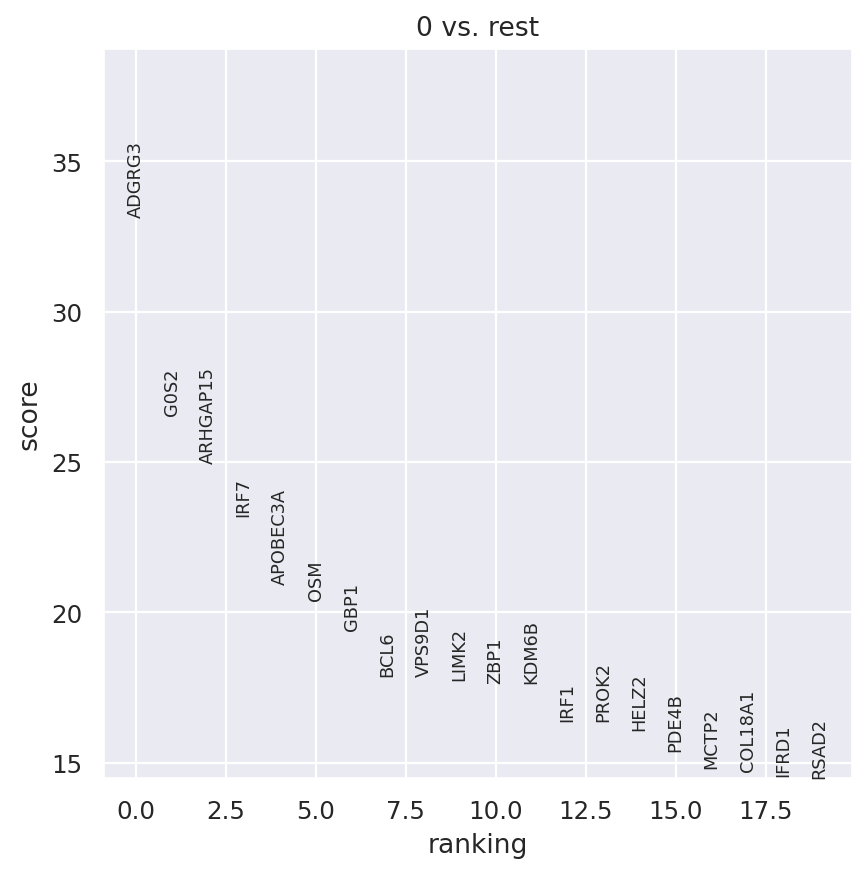

In [61]:
cluster_0_cells = adata[adata.obs['leiden'] == '0']

sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='rest')

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [66]:
high_cell_samples

2         2042_00_BAL
14      LT121R_00_BAL
16      LT181L_00_BAL
17    LT205LUL_00_BAL
20    LT236LUL_00_BAL
Name: Sample_ID, dtype: object

In [70]:
sample_info = []
for sample in adata.obs['Sample'].unique():
    sample_data = adata[adata.obs['Sample'] == sample]
    sample_info.append([sample, sample_data.n_obs, sample_data.n_vars])

df = pd.DataFrame(sample_info, columns=['Sample_ID', 'Cell_Number', 'Gene_Number'])

df

,Sample_ID,Cell_Number,Gene_Number
0,2022_15_BAL,23,12742
1,2027_00_BAL,1918,12742
2,2042_00_BAL,18988,12742
3,2043_00_BAL,164,12742
4,2050_00_BAL,2976,12742
5,2054_00_blood,3826,12742
6,2055_00_BAL,2142,12742
7,2060_41_blood,355,12742
8,2070_00_blood,2561,12742
9,2072_00_blood,5159,12742
